In [40]:
import xarray as xr
import rasterio as rio
import rioxarray
import numpy as np
import matplotlib.pyplot as plt
from osgeo import gdal, gdal_array
from skimage import data, filters
from scipy.interpolate import interpn
import os
from glob import glob

In [41]:
igram_date = '20200120_20200201'
offset_date = '20191004_20191227'
work_dir = '/mnt/Backups/gbrench/repos/fusits/nbs/imja/agu_push/AT12'
unwrapped_noest_fn = f'{work_dir}/work/merged/interferograms/{igram_date}/filt_fine_aoi_noest.unw'
wrapped_fn = f'{work_dir}/work/merged/interferograms/{igram_date}/filt_fine_aoi.int'
cor_fn = f'{work_dir}/work/merged/interferograms/{igram_date}/filt_fine_aoi.cor'
components_fn = f'{work_dir}/work/merged/interferograms/{igram_date}/conn_comp'
offset_fn = f'{work_dir}/fusion_pairs/{offset_date}_offset/phony_filt_fine_aoi_noest.unw'

In [35]:
wrapped_ds = gdal.Open(wrapped_fn, gdal.GA_ReadOnly)
wrapped = wrapped_ds.GetRasterBand(1).ReadAsArray()

cor_ds = gdal.Open(cor_fn, gdal.GA_ReadOnly)
cor = cor_ds.GetRasterBand(1).ReadAsArray()

unwrapped_ds = gdal.Open(unwrapped_noest_fn, gdal.GA_ReadOnly)
unwrapped_noest = unwrapped_ds.GetRasterBand(1).ReadAsArray()

components_ds = gdal.Open(components_fn, gdal.GA_ReadOnly)
components = components_ds.GetRasterBand(1).ReadAsArray()

offset_ds = gdal.Open(offset_fn, gdal.GA_ReadOnly)
offset = offset_ds.GetRasterBand(1).ReadAsArray()

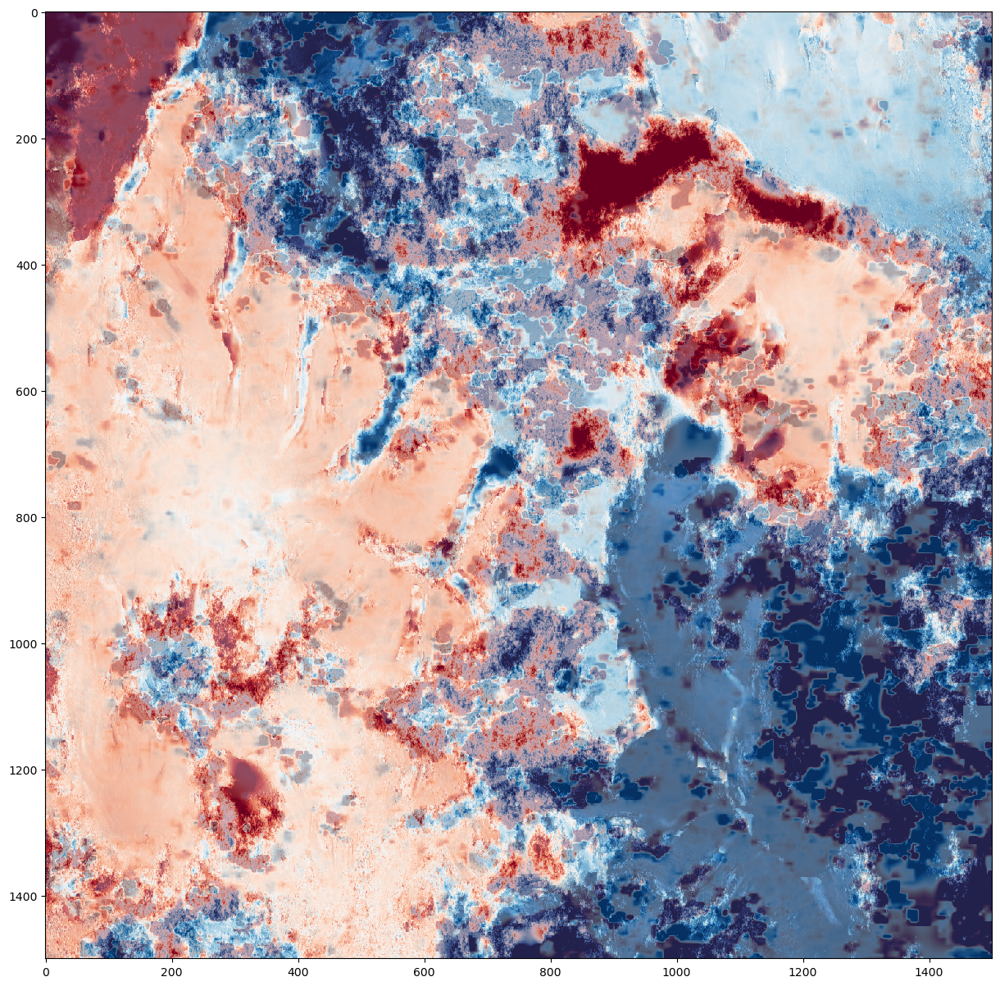

In [39]:
f, ax = plt.subplots(figsize=(15, 15))
ax.imshow(np.flip(offset, 0), cmap='RdBu_r', vmin=-500, vmax=500, interpolation='none')
ax.imshow(np.flip(unwrapped_noest, 0), cmap='RdBu_r', vmin=-10, vmax=10, interpolation='none', alpha=0.7)

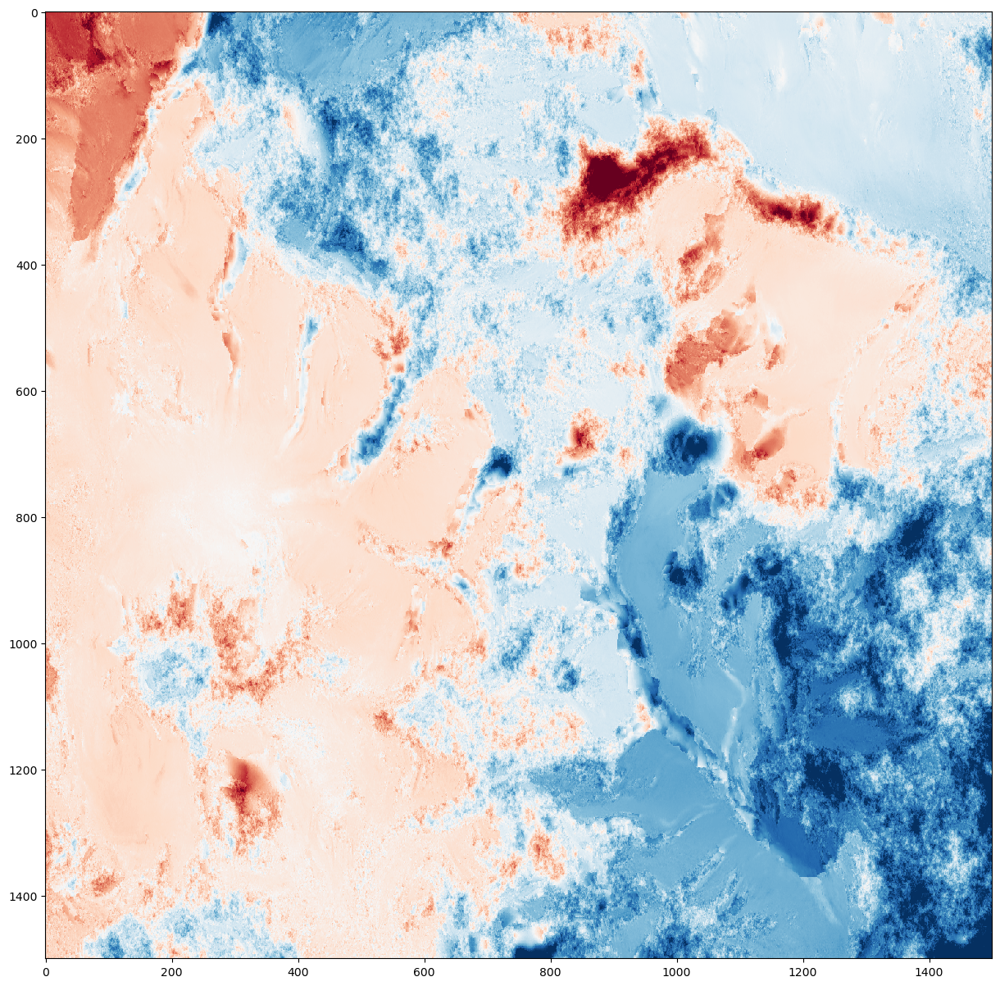

In [14]:
f, ax = plt.subplots(figsize=(15, 15))
ax.imshow(np.flip(unwrapped_noest, 0), cmap='RdBu_r', vmin=-20, vmax=20, interpolation='none')

In [42]:
fusion_pair_path = '/mnt/Backups/gbrench/repos/fusits/nbs/imja/agu_push/AT12/fusion_pairs'
offset_dir = glob(f'{fusion_pair_path}/*_offset')[0]
igram_dir = glob(f'{fusion_pair_path}/*_interferogram')[0]


os.chdir(offset_dir)

igram_fn = f'{igram_dir}/filt_fine.int'
igram_ds = gdal.Open(igram_fn, gdal.GA_ReadOnly)
igram = igram_ds.GetRasterBand(1).ReadAsArray()

offset_fn = f'{offset_dir}/range_offset.tif'
offset_ds = gdal.Open(offset_fn, gdal.GA_ReadOnly)
offset = offset_ds.GetRasterBand(1).ReadAsArray()
offset = np.nan_to_num(offset, nan=0)

non_zero_rows = np.any(igram != 0, axis=1)
non_zero_cols = np.any(igram != 0, axis=0)
igram_crop = igram[non_zero_rows][:, non_zero_cols]

non_zero_rows = np.any(offset != 0, axis=1)
non_zero_cols = np.any(offset != 0, axis=0)
offset_crop = offset[non_zero_rows][:, non_zero_cols]

# Find rows and columns with all zeros and remove them in each direction
row_sum = np.sum(igram, axis=1)
col_sum = np.sum(igram, axis=0)
top_padding = 0
bottom_padding = 0
left_padding = 0
right_padding = 0

# Determine top padding
while row_sum[top_padding] == 0:
    top_padding += 1

# Determine bottom padding
while row_sum[-1 - bottom_padding] == 0:
    bottom_padding += 1

# Determine left padding
while col_sum[left_padding] == 0:
    left_padding += 1

# Determine right padding
while col_sum[-1 - right_padding] == 0:
    right_padding += 1

# interpolate to match interferogram dimensions
x_coords = np.linspace(0, offset_crop.shape[1]-1, offset_crop.shape[1])
y_coords = np.linspace(0, offset_crop.shape[0]-1, offset_crop.shape[0])

# Create a mesh grid for the interferogram dimensions
x_coords_new, y_coords_new = np.meshgrid(
    np.linspace(x_coords.min(), x_coords.max(), igram_crop.shape[1]),
    np.linspace(y_coords.min(), y_coords.max(), igram_crop.shape[0])
)

# Perform bilinear interpolation using scipy.interpolate.interpn
offset = interpn((y_coords, x_coords), offset_crop, (y_coords_new, x_coords_new), method="linear")

offset_phase = offset*(12.5663706/0.05546576)
# pad to original interferogram dimensions
offset_full = np.pad(offset_phase, ((top_padding, bottom_padding), (left_padding, right_padding)), mode='constant')

offset_aoi = offset_full[3250:4750, 2600:4100]

In [44]:
igram.shape

(5064, 9149)

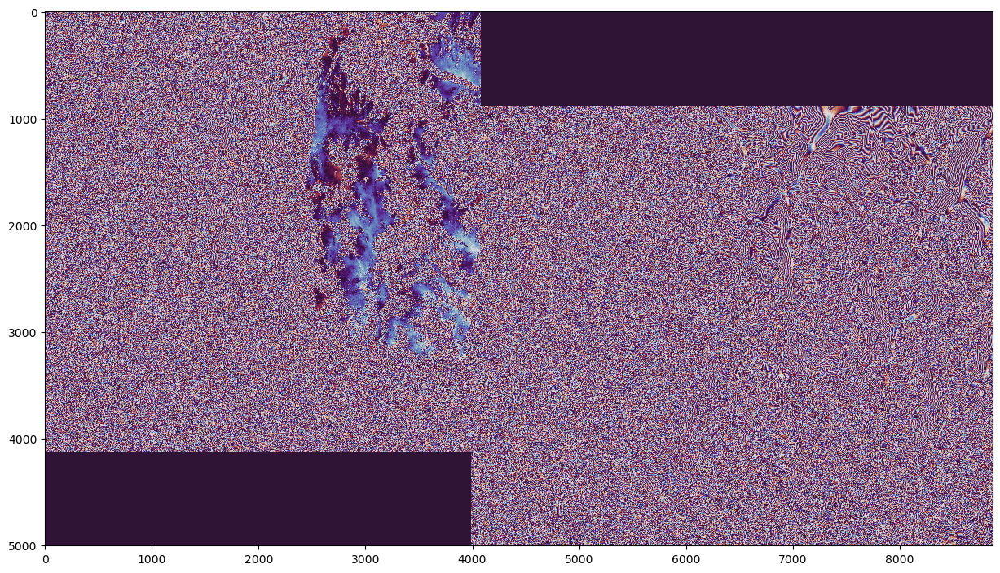

In [24]:
f, ax = plt.subplots(figsize=(15, 15))
ax.imshow(np.flip(np.angle(igram_crop), 0), cmap='twilight', interpolation='none')

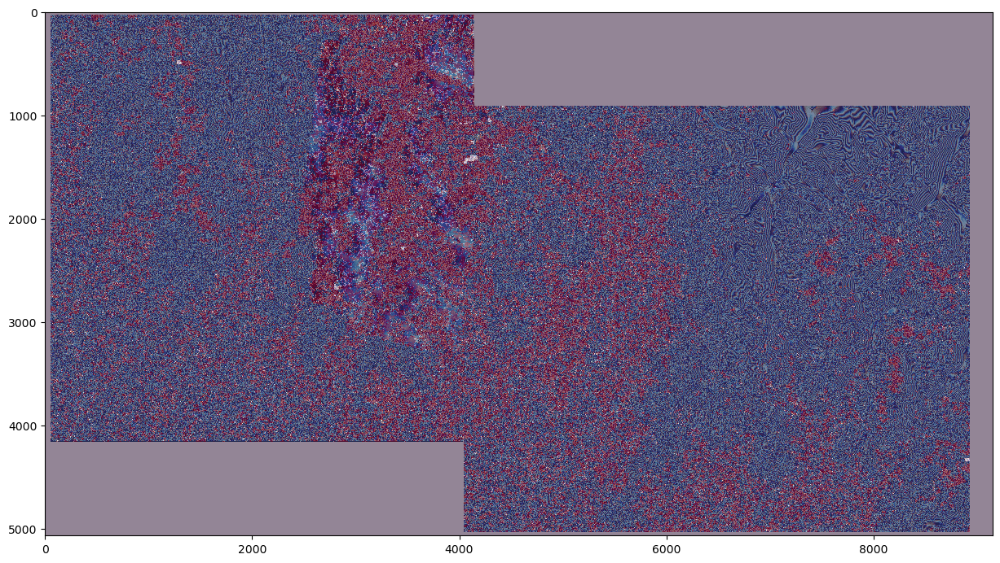

In [33]:
f, ax = plt.subplots(figsize=(15, 15))
ax.imshow(np.flip(offset_full, 0), cmap='RdBu_r', vmin=-20, vmax=20, interpolation='none')
ax.imshow(np.flip(np.angle(igram), 0), cmap='twilight', interpolation='none', alpha=0.5)